In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
from scipy.stats import zscore
from sklearn.preprocessing  import power_transform, StandardScaler, LabelEncoder
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_classif
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.linear_model import LogisticRegression,LinearRegression, SGDRegressor,Ridge, Lasso
from sklearn.metrics import roc_curve, auc, roc_auc_score,accuracy_score, r2_score, classification_report,confusion_matrix,  mean_absolute_error, mean_squared_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.svm import SVR
import pickle
import warnings
warnings.filterwarnings('ignore')

In [5]:
df = pd.read_csv("WA_Fn-UseC_-HR-Employee-Attrition.csv")

In [6]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [7]:
df.min()

Age                                                18
Attrition                                          No
BusinessTravel                             Non-Travel
DailyRate                                         102
Department                            Human Resources
DistanceFromHome                                    1
Education                                           1
EducationField                        Human Resources
EmployeeCount                                       1
EmployeeNumber                                      1
EnvironmentSatisfaction                             1
Gender                                         Female
HourlyRate                                         30
JobInvolvement                                      1
JobLevel                                            1
JobRole                     Healthcare Representative
JobSatisfaction                                     1
MaritalStatus                                Divorced
MonthlyIncome               

In [8]:
df.mean()

Age                            36.923810
DailyRate                     802.485714
DistanceFromHome                9.192517
Education                       2.912925
EmployeeCount                   1.000000
EmployeeNumber               1024.865306
EnvironmentSatisfaction         2.721769
HourlyRate                     65.891156
JobInvolvement                  2.729932
JobLevel                        2.063946
JobSatisfaction                 2.728571
MonthlyIncome                6502.931293
MonthlyRate                 14313.103401
NumCompaniesWorked              2.693197
PercentSalaryHike              15.209524
PerformanceRating               3.153741
RelationshipSatisfaction        2.712245
StandardHours                  80.000000
StockOptionLevel                0.793878
TotalWorkingYears              11.279592
TrainingTimesLastYear           2.799320
WorkLifeBalance                 2.761224
YearsAtCompany                  7.008163
YearsInCurrentRole              4.229252
YearsSinceLastPr

In [9]:
df.max()

Age                                           60
Attrition                                    Yes
BusinessTravel                     Travel_Rarely
DailyRate                                   1499
Department                                 Sales
DistanceFromHome                              29
Education                                      5
EducationField                  Technical Degree
EmployeeCount                                  1
EmployeeNumber                              2068
EnvironmentSatisfaction                        4
Gender                                      Male
HourlyRate                                   100
JobInvolvement                                 4
JobLevel                                       5
JobRole                     Sales Representative
JobSatisfaction                                4
MaritalStatus                             Single
MonthlyIncome                              19999
MonthlyRate                                26999
NumCompaniesWorked  

In [14]:
df.value_counts

<bound method DataFrame.value_counts of       Age Attrition     BusinessTravel  DailyRate              Department  \
0      41       Yes      Travel_Rarely       1102                   Sales   
1      49        No  Travel_Frequently        279  Research & Development   
2      37       Yes      Travel_Rarely       1373  Research & Development   
3      33        No  Travel_Frequently       1392  Research & Development   
4      27        No      Travel_Rarely        591  Research & Development   
...   ...       ...                ...        ...                     ...   
1465   36        No  Travel_Frequently        884  Research & Development   
1466   39        No      Travel_Rarely        613  Research & Development   
1467   27        No      Travel_Rarely        155  Research & Development   
1468   49        No  Travel_Frequently       1023                   Sales   
1469   34        No      Travel_Rarely        628  Research & Development   

      DistanceFromHome  Education E

In [15]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [16]:
df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [17]:
#  EDA
#  Total Numbers of Rows and Column
df.shape

(1470, 35)

In [18]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [19]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [20]:
#   Checking Null Values in dataset
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

<AxesSubplot:>

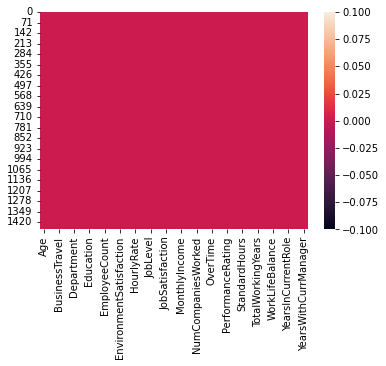

In [21]:
#    There is no null value present in our dataset

#    Checking  Null Values by heatmap also
sns.heatmap(df.isnull())

In [22]:
#Information about Data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [23]:
#  blank value in our Target Column
df[df['Attrition'] == ''].index

Int64Index([], dtype='int64')

In [24]:
# Checking the dataset contains any space or not
df[df['Attrition'] == '']

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager


In [25]:
#    unique values present in the Target Variable.
df['Attrition'].unique()

array(['Yes', 'No'], dtype=object)

In [26]:
df['Attrition'].nunique()

2

In [27]:
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

In [28]:
#  all Values in the targeted variable
df['Attrition'].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

In [29]:
# Data preprocessing and data Cleaning
#  Dropping irrelevant column
#   Column 'EmployeeNumber' have no any relation with our Target Column.
df=df.drop(columns="EmployeeNumber", axis=1)

In [30]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'Over18',
       'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [31]:
# Descriptive Statistics
# Description of Dataset
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,2.721769,65.891156,2.729932,2.063946,2.728571,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,1.093082,20.329428,0.711561,1.106940,1.102846,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,30.000000,1.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,2.000000,48.000000,2.000000,1.000000,2.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,3.000000,66.000000,3.000000,2.000000,3.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,4.000000,83.750000,3.000000,3.000000,4.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,4.000000,100.000000,4.000000,5.000000,4.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


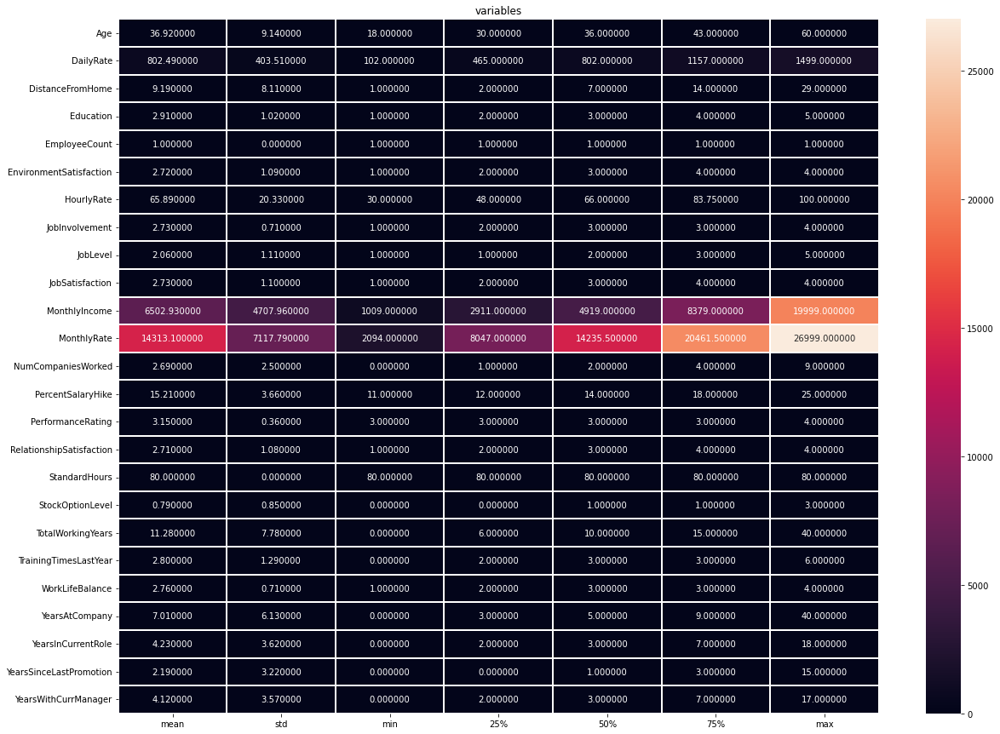

In [33]:
#   Checking Description through heatmap also.
plt.figure(figsize=(20,15))
sns.heatmap(round(df.describe()[1:].transpose(),2),linewidth=2,annot=True,fmt='f')
plt.xticks(fontsize=14)
plt.xticks(fontsize=10)
plt.title('variables')
plt.show()

Observation of Describe of Datasets:
The summary of this dataset looks good as there are no negative/ invalid value present.

We can see the counts of all the columns are 30 which means no null values are present.

Total No of Rows: 1470 and Total No. of Columns: 35

We are determining Mean, Standard Deviation, Minimum and Maximum Values of each column: 'Age','DailyRate','DistanceFromHome','Education','EmployeeCount','EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel','TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating'

In most columns mean and 50% have same value.

Also mean is greater than standard deviation.

Columns: TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager have a big difference between 75% and max.

We can observe that the dataset seems to be having more outliers as well as skewness in the data on the basis of Quantile median result.

Data Visualization
Univariate Analysis
Using Countplot for categorical columns

No     1233
Yes     237
Name: Attrition, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='count'>

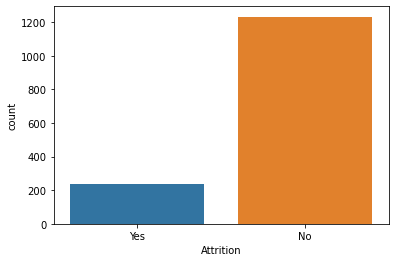

In [34]:
#Countplot for "Attrition" column
print(df['Attrition'].value_counts())
sns.countplot('Attrition',data=df)

We can see 237 employee have left company and 1233 still working.

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


<AxesSubplot:xlabel='BusinessTravel', ylabel='count'>

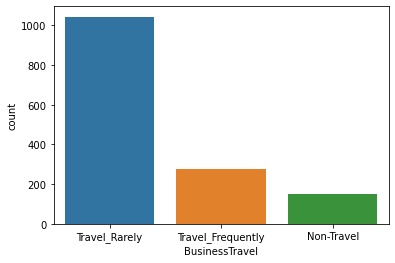

In [35]:
#Countplot for "BusinessTravel" column
print(df['BusinessTravel'].value_counts())
sns.countplot('BusinessTravel',data=df)

We can see total numbers of employees travels frequently for business purpose are 277, 

those who travel rarely are 1043 and 

those who never travelled are 150.

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


<AxesSubplot:xlabel='Department', ylabel='count'>

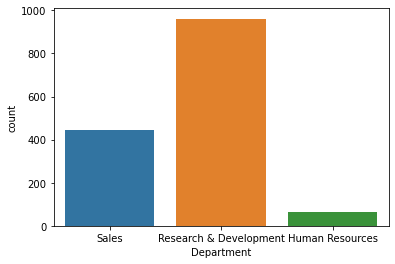

In [36]:
#Countplot for "Department" column
print(df['Department'].value_counts())
sns.countplot('Department',data=df)

Total no of employees in these departments are:

In Sales are 446

In Research & Development are 961

In HR are 63

Male      882
Female    588
Name: Gender, dtype: int64


<AxesSubplot:xlabel='Gender', ylabel='count'>

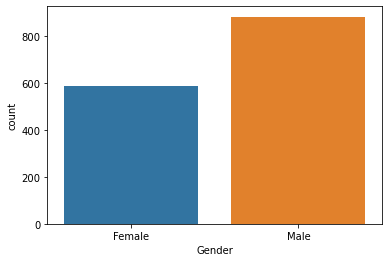

In [37]:
#Countplot for "Gender" column
print(df['Gender'].value_counts())
sns.countplot('Gender',data=df)

total number of male employees
 is 882 and 
 female employees are 588.

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64


<AxesSubplot:xlabel='EducationField', ylabel='count'>

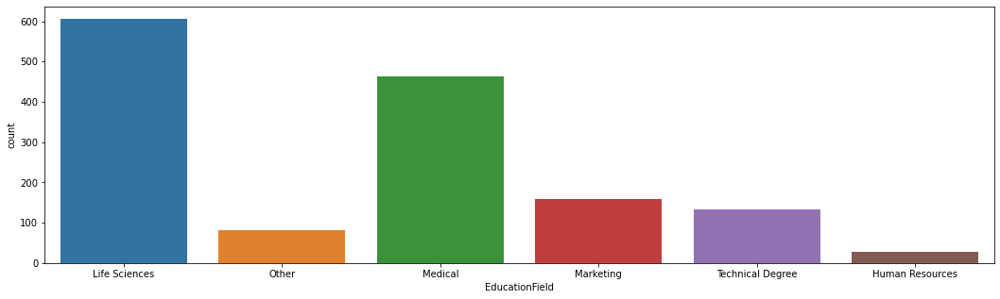

In [38]:
#Countplot for "EducationField" column
print(df['EducationField'].value_counts())
plt.figure(figsize=(18,5))
sns.countplot('EducationField',data=df)

We can see, educational background of employees working in company:

606 employees have studied Life Sciences
464 employees have studied Medical
159 employees have studied Marketing
132 employees have studied Technical Degree
82 employees have studied Other
27 employees have studied Human Resources

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64


<AxesSubplot:xlabel='JobRole', ylabel='count'>

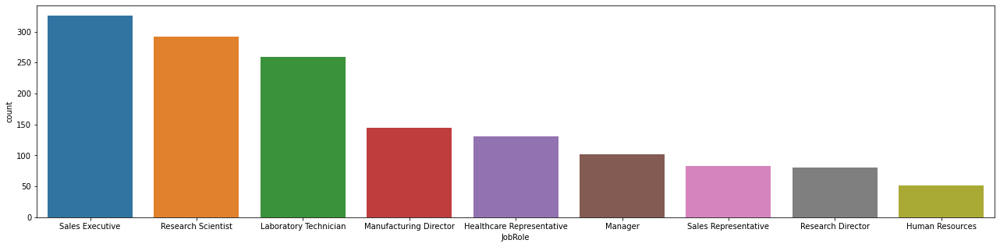

In [39]:
#Countplot for "JobRole" column
plt.figure(figsize=(22,5))
print(df['JobRole'].value_counts())
sns.countplot('JobRole',data=df)

We can see 9 job roles are present in the company and various number of employees are working under these job roles:

326 employees are working as Sales Executive
292 employees are working as Research Scientist
259 employees are working as Laboratory Technician
145 employees are working as Manufacturing Director
131 employees are working as Healthcare Representative
102 employees are working as Manager
83 employees are working as Sales Representative
80 employees are working as Research Director
52 employees are working as Human Resources

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64


<AxesSubplot:xlabel='MaritalStatus', ylabel='count'>

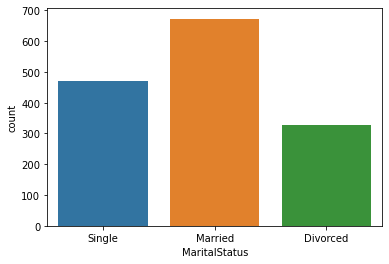

In [40]:
#Countplot for "MaritalStatus" column
print(df['MaritalStatus'].value_counts())
sns.countplot('MaritalStatus',data=df)

Married employees are 673, Single employees are 470 and Divorced employees are 327 in the company.



Y    1470
Name: Over18, dtype: int64


<AxesSubplot:xlabel='Over18', ylabel='count'>

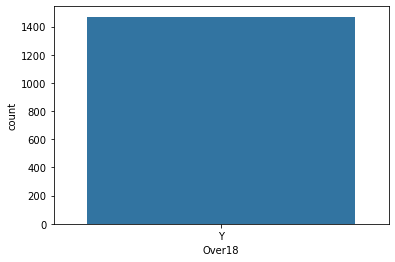

In [41]:
#Countplot for "Over18" column
print(df['Over18'].value_counts())
sns.countplot('Over18',data=df)

We can see that there is only one attribute and that is yes for column 'Over18', so it have no relation with our target column and we will drop this column.

No     1054
Yes     416
Name: OverTime, dtype: int64


<AxesSubplot:xlabel='OverTime', ylabel='count'>

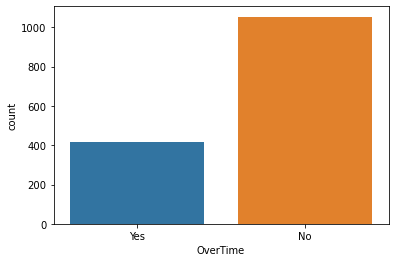

In [42]:
#Countplot for "OverTime" column
print(df['OverTime'].value_counts())
sns.countplot('OverTime',data=df)

We can see employees doing overtime are 416 and not doing are 1054


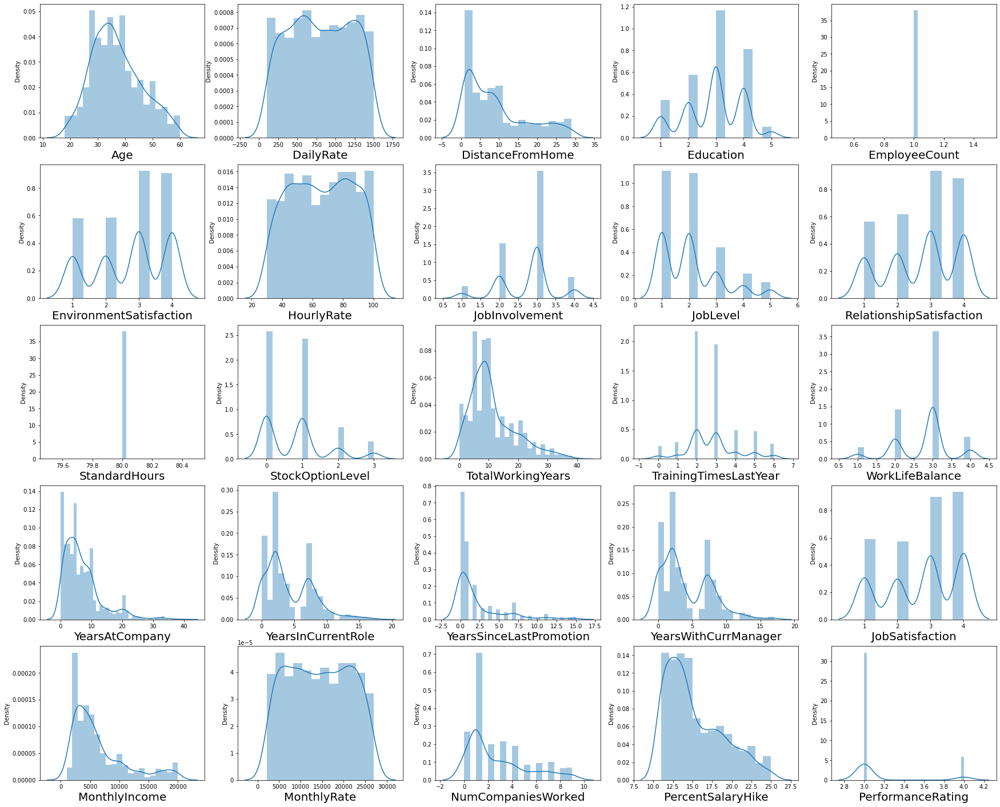

In [44]:
#   Using Distplot for continuous columns

collist=['Age','DailyRate','DistanceFromHome','Education','EmployeeCount','EnvironmentSatisfaction', 'HourlyRate',
         'JobInvolvement','JobLevel','RelationshipSatisfaction','StandardHours', 'StockOptionLevel','TotalWorkingYears', 
         'TrainingTimesLastYear', 'WorkLifeBalance','YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
         'YearsWithCurrManager', 'JobSatisfaction','MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 
         'PerformanceRating']

plt.figure(figsize=(30,25))
plotnumber = 1

for column in df[collist]:
    if plotnumber<=25:
        ax = plt.subplot(5,5,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

[41 49 37 33 27 32 59 30 38 36 35 29 31 34 28 22 53 24 21 42 44 46 39 43
 50 26 48 55 45 56 23 51 40 54 58 20 25 19 57 52 47 18 60]


<AxesSubplot:xlabel='Attrition', ylabel='Age'>

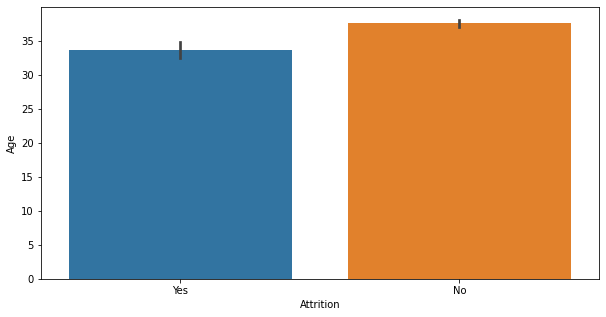

In [46]:
#  Bivariate Analysis
#  Using Barplot
#  Barplot for comparision between "Age" and "Attrition" column
print(df['Age'].unique())
plt.figure(figsize=(10,5))
sns.barplot(y='Age', x='Attrition', data=df)

We can see those employee's whose age is more than 38 are still in the company and those employees whose age is between 18 to 34 have left the company



<AxesSubplot:xlabel='Attrition', ylabel='DailyRate'>

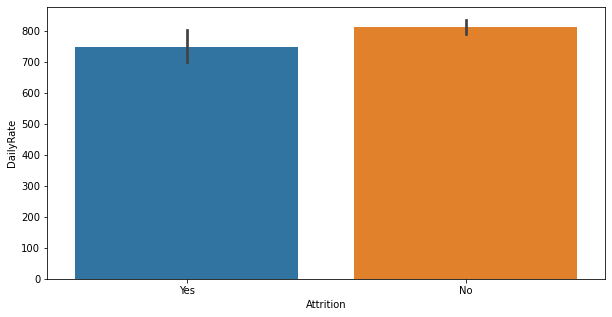

In [48]:
#barplot for comparision between "DailyRate" and "Attrition" column
plt.figure(figsize=(10,5))
sns.barplot(y='DailyRate', x='Attrition', data=df)

We can see DailyRate of Attrition in the company is 750 and DailyRate of Attrition not in the company is 800

<AxesSubplot:xlabel='Attrition', ylabel='DistanceFromHome'>

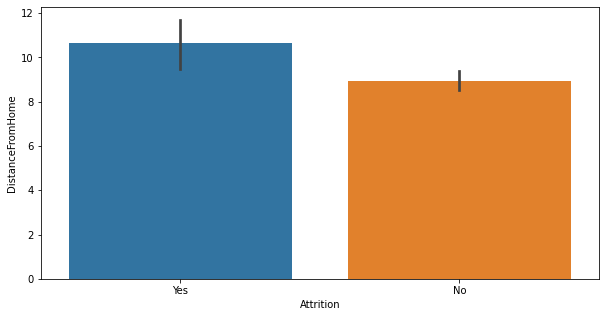

In [49]:
#barplot for comparision between "DistanceFromHome" and "Attrition" column
#print(HR['DistanceFromHome'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='DistanceFromHome', x='Attrition', data=df)

We can see Attrition is more for DistanceFromHome to company is 11 and those not is 9

3    572
4    398
2    282
1    170
5     48
Name: Education, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='Education'>

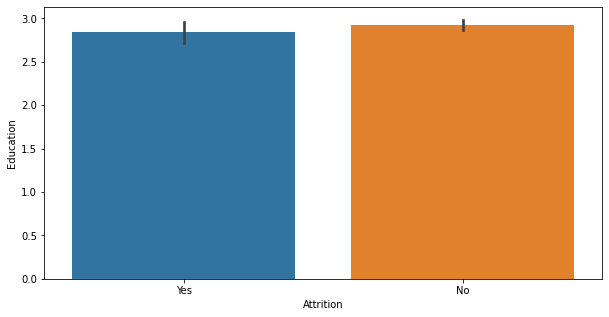

In [50]:
#Barplot for comparision between "Education" and "Attrition" column
print(df['Education'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='Education', x='Attrition', data=df)

More Educated employees are in the company and less Educated employees are not in the company.

1    1470
Name: EmployeeCount, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='EmployeeCount'>

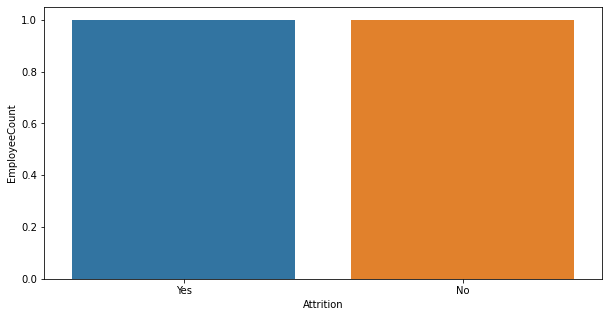

In [51]:
#Barplot for comparision between "EmployeeCount" and "Attrition" column
print(df['EmployeeCount'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='EmployeeCount', x='Attrition', data=df)

In [52]:
#   We will drop column 'EmployeeCount' as it have only one value "1470" and it have no relation with target variable.

3    453
4    446
2    287
1    284
Name: EnvironmentSatisfaction, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='EnvironmentSatisfaction'>

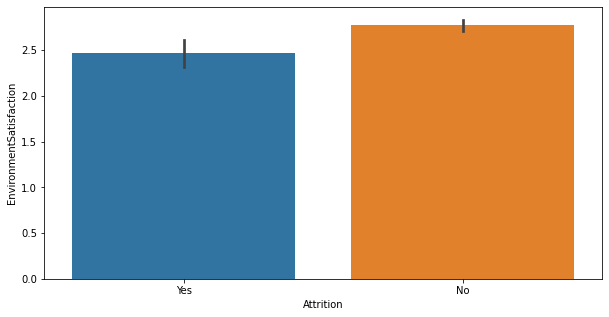

In [53]:
#Barplot for comparision between "EnvironmentSatisfaction" and "Attrition" column
print(df['EnvironmentSatisfaction'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='EnvironmentSatisfaction', x='Attrition', data=df)

In [54]:
#    Employees not satisfied with environment have left company and it is less compare to employees who are satisfied with environment

66    29
98    28
42    28
48    28
84    28
      ..
31    15
53    14
68    14
38    13
34    12
Name: HourlyRate, Length: 71, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='HourlyRate'>

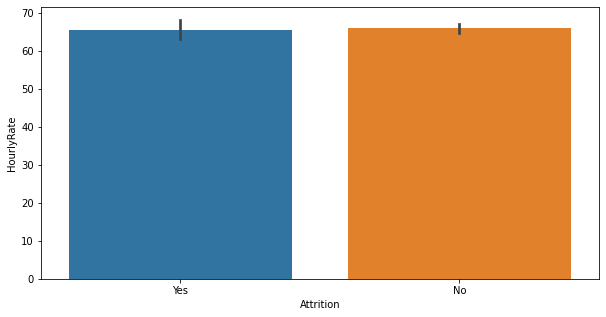

In [55]:
#Barplot for comparision between "HourlyRate" and "Attrition" column
print(df['HourlyRate'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='HourlyRate', x='Attrition', data=df)

In [56]:
#    Those employees left and still in company are equal as per hourly rate. So, we will drop this column as well.

3    868
2    375
4    144
1     83
Name: JobInvolvement, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='JobInvolvement'>

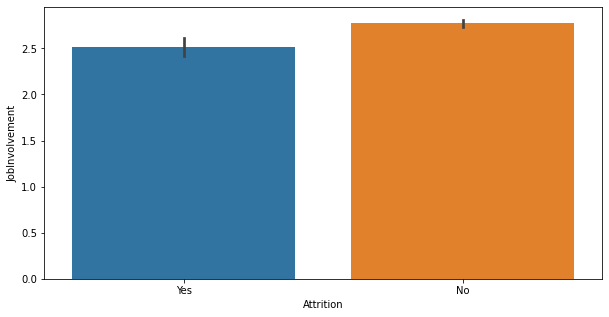

In [57]:
#Barplot for comparision between "JobInvolvement" and "Attrition" column
print(df['JobInvolvement'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='JobInvolvement', x='Attrition', data=df)

In [58]:
#  Employees involved most in jobs are in the company.

1    543
2    534
3    218
4    106
5     69
Name: JobLevel, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='JobLevel'>

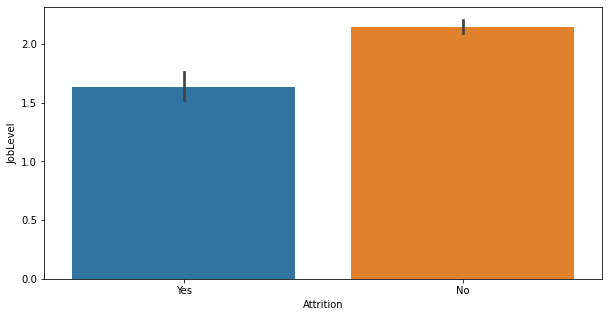

In [59]:
#Barplot for comparision between "JobLevel" and "Attrition" column
print(df['JobLevel'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='JobLevel', x='Attrition', data=df)

In [60]:
#  Attrition is less due to Level of Job in company

3    459
4    432
2    303
1    276
Name: RelationshipSatisfaction, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='RelationshipSatisfaction'>

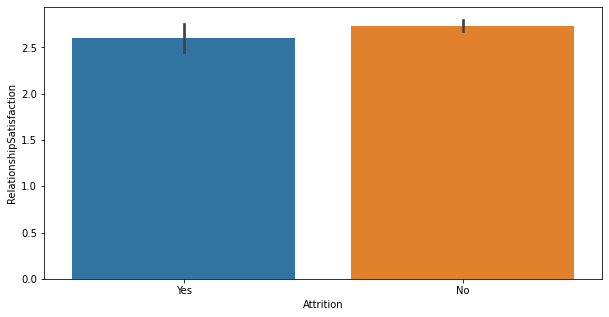

In [61]:
#Barplot for comparision between "RelationshipSatisfaction" and "Attrition" column
print(df['RelationshipSatisfaction'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='RelationshipSatisfaction', x='Attrition', data=df)

In [62]:
#  Employess are satisfied more due to relationship with company or employees

80    1470
Name: StandardHours, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='StandardHours'>

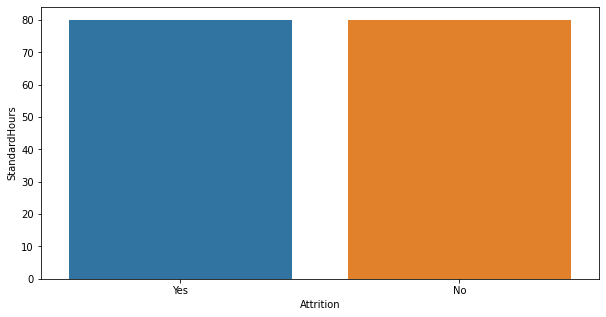

In [63]:
#Barplot for comparision between "StandardHours" and "Attrition" column
print(df['StandardHours'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='StandardHours', x='Attrition', data=df)

This column "StandardHours" have also only one value. So, we will also drop this column as it have no relation with Target column "Attrition".

0    631
1    596
2    158
3     85
Name: StockOptionLevel, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='StockOptionLevel'>

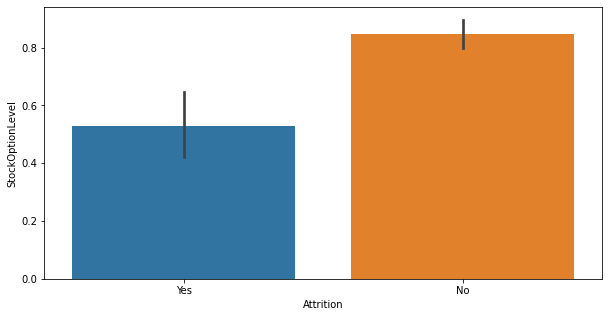

In [64]:
#Barplot for comparision between "StockOptionLevel" and "Attrition" column
print(df['StockOptionLevel'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='StockOptionLevel', x='Attrition', data=df)

    Stock option level for attrition is less

<AxesSubplot:xlabel='Attrition', ylabel='TotalWorkingYears'>

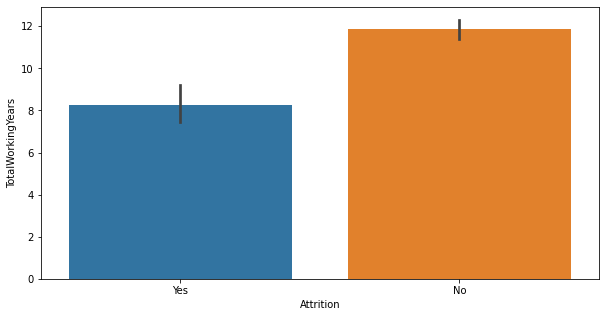

In [65]:
#Barplot for comparision between "TotalWorkingYears" and "Attrition" column
#print(HR['TotalWorkingYears'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='TotalWorkingYears', x='Attrition', data=df)

who have more experience are still in company and those whose experience level is less are not in the company.

2    547
3    491
4    123
5    119
1     71
6     65
0     54
Name: TrainingTimesLastYear, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='TrainingTimesLastYear'>

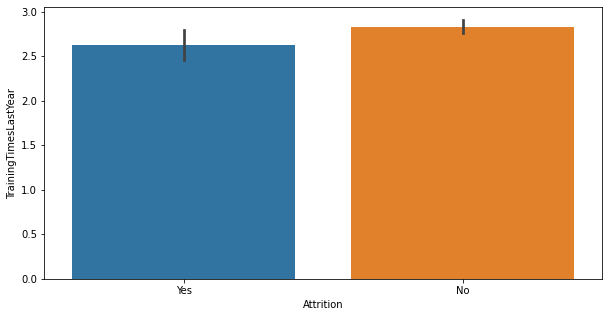

In [67]:
#Barplot for comparision between "TrainingTimesLastYear" and "Attrition" column
print(df['TrainingTimesLastYear'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='TrainingTimesLastYear', x='Attrition', data=df)

Training time is high in last year so attritiom is less

<AxesSubplot:xlabel='Attrition', ylabel='WorkLifeBalance'>

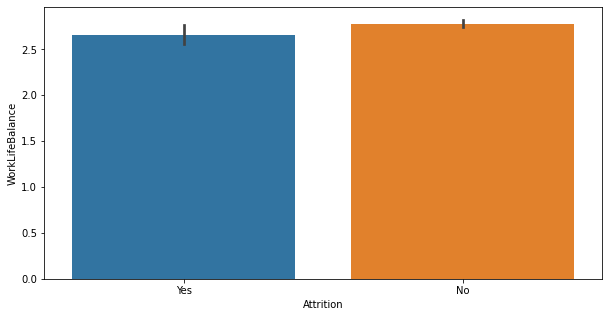

In [68]:
#Barplot for comparision between "WorkLifeBalance" and "Attrition" column
#print(HR['WorkLifeBalance'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='WorkLifeBalance', x='Attrition', data=df)

In [69]:
#Employee working in company having balance in life is more

<AxesSubplot:xlabel='Attrition', ylabel='YearsAtCompany'>

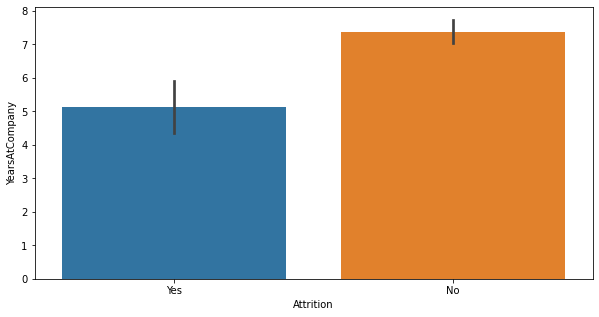

In [70]:
#Barplot for comparision between "YearsAtCompany" and "Attrition" column
#print(HR['YearsAtCompany'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='YearsAtCompany', x='Attrition', data=df)

Employees working from many years at company is more than left employee

<AxesSubplot:xlabel='Attrition', ylabel='YearsInCurrentRole'>

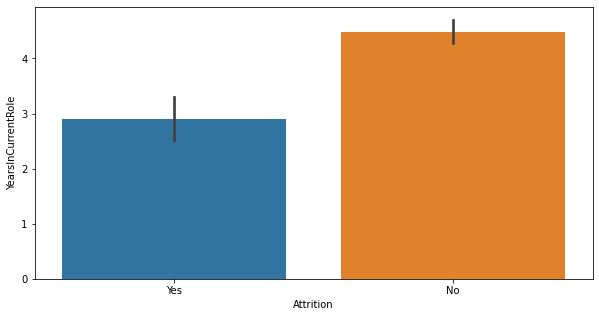

In [71]:
#Barplot for comparision between "YearsInCurrentRole" and "Attrition" column
#print(HR['YearsInCurrentRole'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='YearsInCurrentRole', x='Attrition', data=df)

From many years having same role in company are more.

0     581
1     357
2     159
7      76
4      61
3      52
5      45
6      32
11     24
8      18
9      17
15     13
13     10
12     10
14      9
10      6
Name: YearsSinceLastPromotion, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='YearsSinceLastPromotion'>

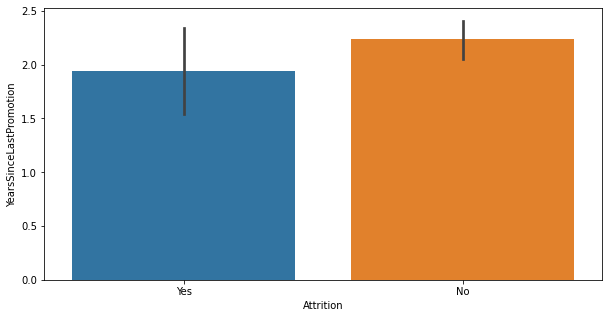

In [72]:
#Barplot for comparision between "YearsSinceLastPromotion" and "Attrition" column
print(df['YearsSinceLastPromotion'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='YearsSinceLastPromotion', x='Attrition', data=df)

In [73]:
# Promotion chances are high in the company

2     344
0     263
7     216
3     142
8     107
4      98
1      76
9      64
5      31
6      29
10     27
11     22
12     18
13     14
17      7
15      5
14      5
16      2
Name: YearsWithCurrManager, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='YearsWithCurrManager'>

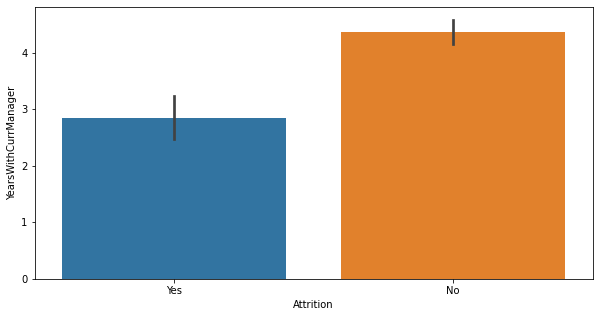

In [74]:
#Barplot for comparision between "YearsWithCurrManager" and "Attrition" column
print(df['YearsWithCurrManager'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='YearsWithCurrManager', x='Attrition', data=df)

In [75]:
#   Having same Manager is more from many years.

4    459
3    442
1    289
2    280
Name: JobSatisfaction, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='JobSatisfaction'>

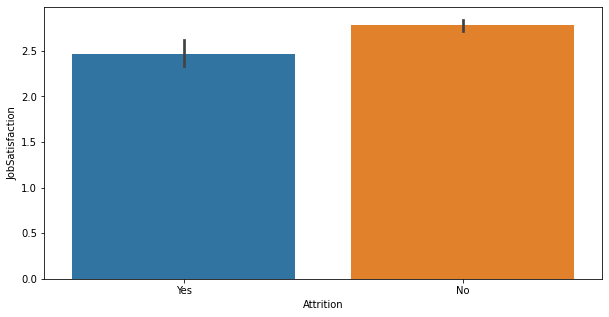

In [76]:
#Barplot for comparision between "JobSatisfaction" and "Attrition" column
print(df['JobSatisfaction'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='JobSatisfaction', x='Attrition', data=df)

In [77]:
#   Employees satisfied with job are more and still in company

<AxesSubplot:xlabel='Attrition', ylabel='MonthlyIncome'>

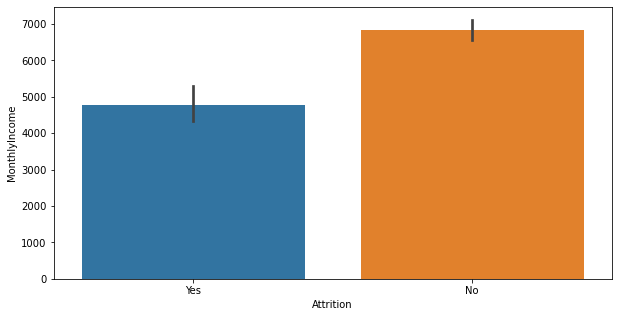

In [78]:
#Barplot for comparision between "MonthlyIncome" and "Attrition" column
#print(HR['MonthlyIncome'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='MonthlyIncome', x='Attrition', data=df)

In [79]:
#  Employees getting monthly income is more than not getting and also left the company

4223     3
9150     3
9558     2
12858    2
22074    2
        ..
14561    1
2671     1
5718     1
11757    1
10228    1
Name: MonthlyRate, Length: 1427, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='MonthlyRate'>

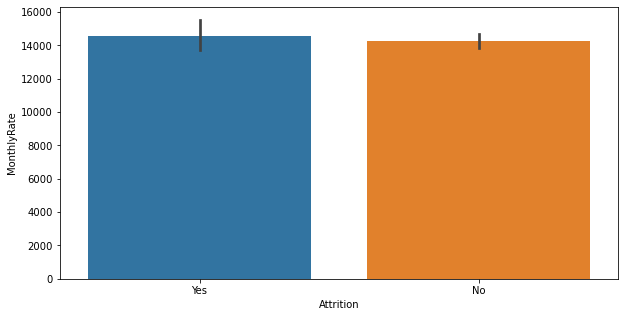

In [80]:
#Barplot for comparision between "MonthlyRate" and "Attrition" column
print(df['MonthlyRate'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='MonthlyRate', x='Attrition', data=df)

In [81]:
#   Not Monthly Rate is high

1    521
0    197
3    159
2    146
4    139
7     74
6     70
5     63
9     52
8     49
Name: NumCompaniesWorked, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='NumCompaniesWorked'>

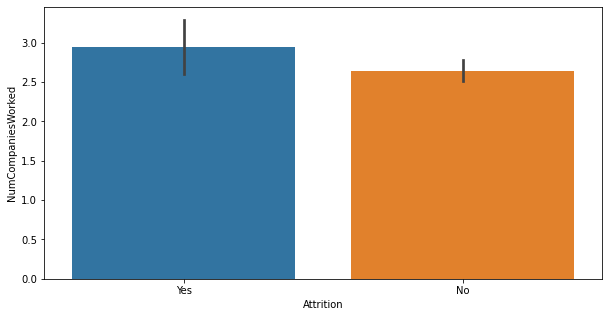

In [82]:
#Barplot for comparision between "NumCompaniesWorked" and "Attrition" column
print(df['NumCompaniesWorked'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='NumCompaniesWorked', x='Attrition', data=df)

In [83]:
#   Employees Worked with more companies are less.

11    210
13    209
14    201
12    198
15    101
18     89
17     82
16     78
19     76
22     56
20     55
21     48
23     28
24     21
25     18
Name: PercentSalaryHike, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='PercentSalaryHike'>

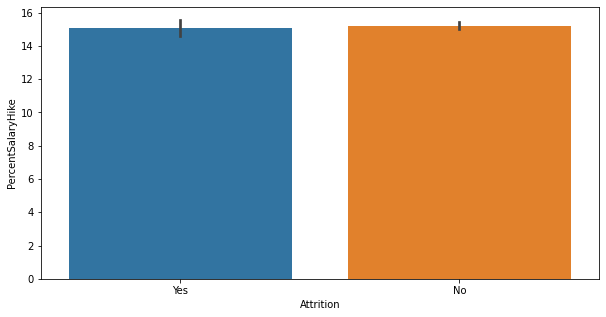

In [84]:
#Barplot for comparision between "PercentSalaryHike" and "Attrition" column
print(df['PercentSalaryHike'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='PercentSalaryHike', x='Attrition', data=df)

In [85]:
#   Percentage of salary hike is equal, so we will drop this column also.

3    1244
4     226
Name: PerformanceRating, dtype: int64


<AxesSubplot:xlabel='Attrition', ylabel='PerformanceRating'>

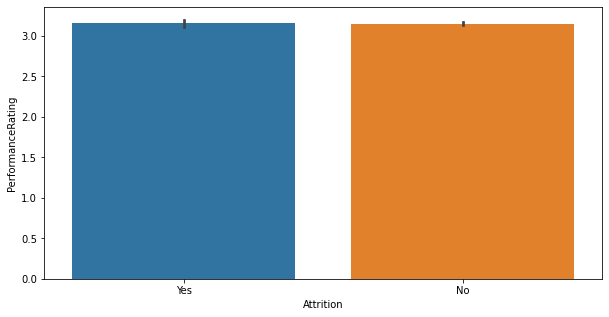

In [86]:
#Barplot for comparision between "PerformanceRating" and "Attrition" column
print(df['PerformanceRating'].value_counts())
plt.figure(figsize=(10,5))
sns.barplot(y='PerformanceRating', x='Attrition', data=df)

In [87]:
#    Rating of Performance is also same for both. So we will drop this column also.

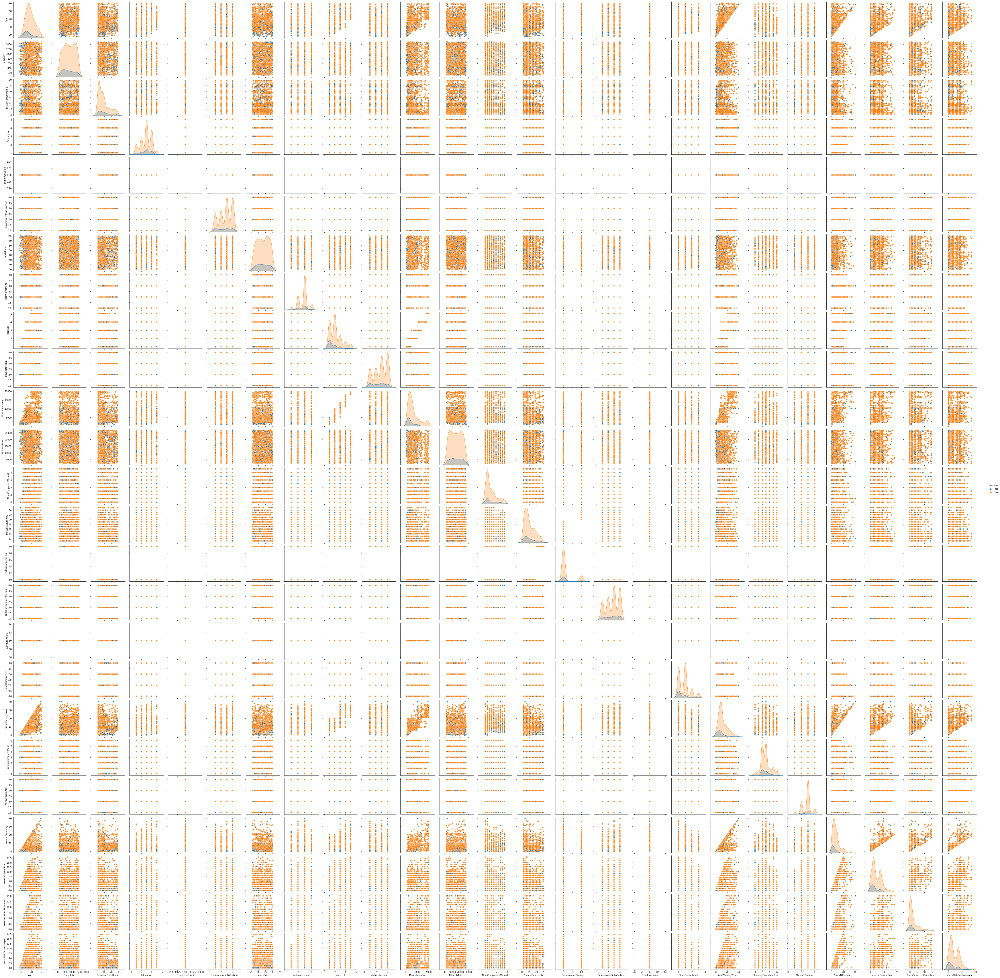

In [88]:
#   Multivariate Analysis
#   Using pairplot
sns.pairplot(data=df,hue="Attrition")

In [89]:
#   pair plot gives the relation between the columns which are plotted on the basis of target variable 'Attrition'.

In [90]:
df.corr()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.010661,-0.001686,0.208034,NaN,0.010146,0.024287,0.029820,0.509604,-0.004892,...,0.053535,NaN,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
DailyRate,0.010661,1.000000,-0.004985,-0.016806,NaN,0.018355,0.023381,0.046135,0.002966,0.030571,...,0.007846,NaN,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,-0.004985,1.000000,0.021042,NaN,-0.016075,0.031131,0.008783,0.005303,-0.003669,...,0.006557,NaN,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.016806,0.021042,1.000000,NaN,-0.027128,0.016775,0.042438,0.101589,-0.011296,...,-0.009118,NaN,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EnvironmentSatisfaction,0.010146,0.018355,-0.016075,-0.027128,NaN,1.000000,-0.049857,-0.008278,0.001212,-0.006784,...,0.007665,NaN,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,0.023381,0.031131,0.016775,NaN,-0.049857,1.000000,0.042861,-0.027853,-0.071335,...,0.001330,NaN,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,0.046135,0.008783,0.042438,NaN,-0.008278,0.042861,1.000000,-0.012630,-0.021476,...,0.034297,NaN,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobLevel,0.509604,0.002966,0.005303,0.101589,NaN,0.001212,-0.027853,-0.012630,1.000000,-0.001944,...,0.021642,NaN,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281
JobSatisfaction,-0.004892,0.030571,-0.003669,-0.011296,NaN,-0.006784,-0.071335,-0.021476,-0.001944,1.000000,...,-0.012454,NaN,0.010690,-0.020185,-0.005779,-0.019459,-0.003803,-0.002305,-0.018214,-0.027656


In [91]:
df=df.drop(columns="Over18", axis=1)

In [92]:
df=df.drop(columns="EmployeeCount", axis=1)
df=df.drop(columns="StandardHours", axis=1)

In [93]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [94]:
df.shape

(1470, 31)

<AxesSubplot:>

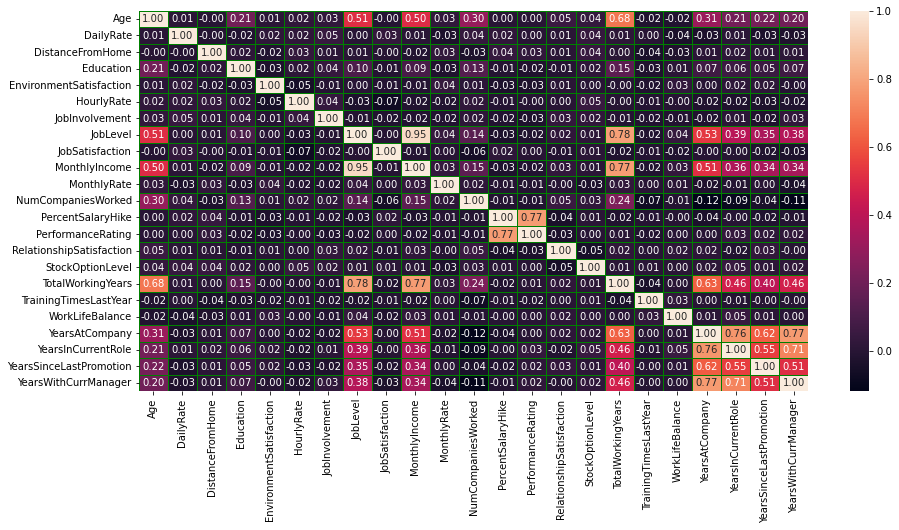

In [97]:
#   correlation with heatmap
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(),annot=True, linewidth=1, linecolor='green', fmt='.2f')

In [98]:
#   Observation of Correlation
#    "JobLevel" is correlated to Age as employees.
#    "MonthlyIncome" is correlated related to joblevel.
#    "PerformanceRating" is correlated to PercentSalaryHike.
#     "TotalWorkingYears" is correlated to JobLevel.
#     "YearsWithCurrManager" is correlated to "YearsAtCompany".
#     "YearsAtCompany" is correlated to "YearsInCurrentRole".

In [99]:
# Label Encoding
encoder=LabelEncoder()

In [100]:
df['Attrition']=encoder.fit_transform(df['Attrition'])
df['BusinessTravel']=encoder.fit_transform(df['BusinessTravel'])
df['Department']=encoder.fit_transform(df['Department'])
df['Gender']=encoder.fit_transform(df['Gender'])
df['EducationField']=encoder.fit_transform(df['EducationField'])
df['JobRole']=encoder.fit_transform(df['JobRole'])
df['MaritalStatus']=encoder.fit_transform(df['MaritalStatus'])
df['OverTime']=encoder.fit_transform(df['OverTime'])

In [101]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,2,0,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,3,1,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,1,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,4,0,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,1,...,3,4,1,6,3,3,2,2,2,2


In [102]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

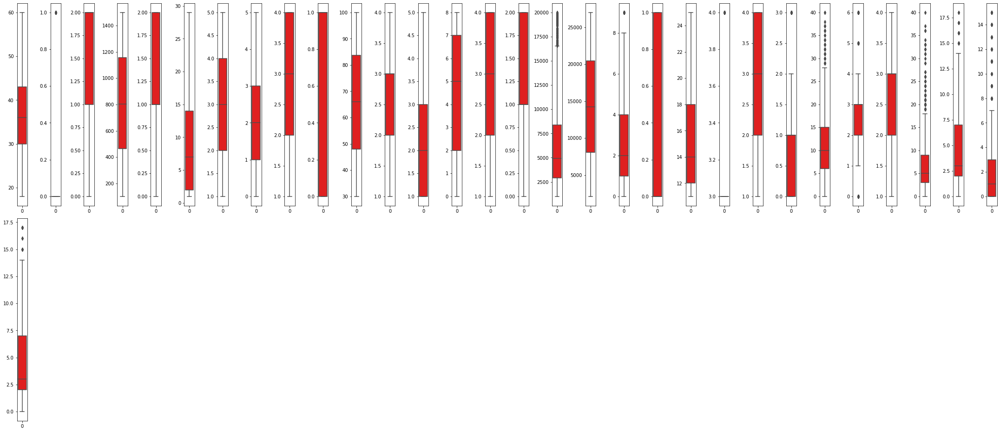

In [104]:
#   Checking Outliers
collist=df.columns.values
ncol=30
nrows=14
plt.figure(figsize=(ncol,3*ncol))
for i in range(0,len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(data=df[collist[i]],color='red',orient='v')
    plt.tight_layout()

In [105]:
#  Observation:
#   Outliers are present in all continuous columns: 'Attrition', 'MonthlyIncome', 'NumCompaniesWorked', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager'
#   But we will not remove Outliers from 'Attrition' column as it is Target column.

In [106]:
#Removing Outliers
#   1. Zscore method using Scipy
#  Outliers will be removed only from Continuous column variable.
# We will not remove outliers from Categorical column and Target Variable.
variable = df[['MonthlyIncome', 'NumCompaniesWorked', 'PerformanceRating', 'StockOptionLevel', 
               'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole',
               'YearsSinceLastPromotion', 'YearsWithCurrManager']]
z=np.abs(zscore(variable))
# Creating new dataframe for regression
df_Analytics = df[(z<3).all(axis=1)]
df_Analytics.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,2,0,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,3,1,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,1,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,4,0,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,1,...,3,4,1,6,3,3,2,2,2,2


In [107]:
print("Old DataFrame data in Rows and Column:",df.shape)
print("New DataFrame data in Rows and Column:",df_Analytics.shape)
print("Total Dropped rows:",df.shape[0]-df_Analytics.shape[0])

Old DataFrame data in Rows and Column: (1470, 31)
New DataFrame data in Rows and Column: (1387, 31)
Total Dropped rows: 83


In [108]:
#  Percentage Data Loss using Zscore
loss_percent=(1470-1387)/1470*100
print(loss_percent,"%")

5.646258503401361 %


In [109]:
#   2. IQR (Inter Quantile Range) method
#1st quantile
Q1=variable.quantile(0.25)
# 3rd quantile
Q3=variable.quantile(0.75)
#IQR
IQR=Q3 - Q1
df_projct=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [110]:
print("Old DataFrame data in Rows and Column:",df.shape)
print("\nNew DataFrame data in Rows and Column:",df_projct.shape)
print("\nTotal Dropped rows:",df.shape[0]-df_projct.shape[0])

Old DataFrame data in Rows and Column: (1470, 31)

New DataFrame data in Rows and Column: (779, 31)

Total Dropped rows: 691


In [111]:
#  Percentage Data Loss using IQR
loss_perc = (1470-779)/1470*100
loss_perc

47.006802721088434

In [112]:
#    We can check by using IQR method there is large data loss in comparision to Zscore method. So, we will consider Zscore method.

In [113]:
#Checking for the skewness
df_Analytics.skew()

Age                         0.472280
Attrition                   1.805983
BusinessTravel             -1.426774
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome            0.954752
Education                  -0.289024
EducationField              0.544868
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
OverTime                    0.954751
PercentSalaryHike           0.800592
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
Y

In [114]:
#   Observation:
#   There is skewness in many of the columns.

#   Skewness threshold taken is +/-0.65. Columns which are having skewness: 'BusinessTravel','DistanceFromHome', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'YearsSinceLastPromotion'. So, we will remove skewness from these columns.

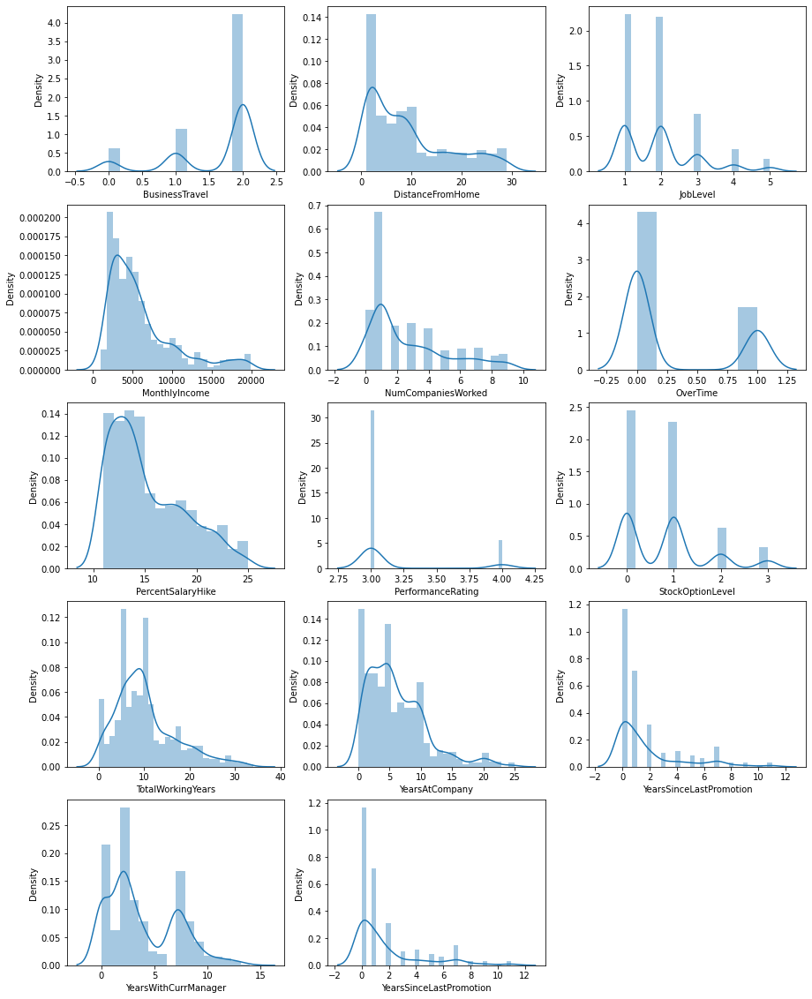

In [116]:
#   Checking skewness through data visualization
collist=[  'BusinessTravel', 'DistanceFromHome', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'YearsSinceLastPromotion']
plt.figure(figsize=(15,20))
plotnumber = 1
for column in df_Analytics[collist]:
    if plotnumber<=14:
        ax = plt.subplot(5,3,plotnumber)
        sns.distplot(df_Analytics[column])
        plt.xlabel(column,fontsize=10)
    plotnumber+=1
plt.show()

In [118]:
collist=[  'BusinessTravel','DistanceFromHome', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'YearsSinceLastPromotion']

df_Analytics[collist]=power_transform(df_Analytics[collist],method='yeo-johnson')
df_Analytics[collist]

,BusinessTravel,DistanceFromHome,JobLevel,MonthlyIncome,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,YearsSinceLastPromotion
0,0.638730,-1.489968,0.349828,0.386674,1.620671,1.584737,-1.495549,-1.665335e-16,-1.084263,-0.173231,0.231837,-1.073534,0.582177,-1.073534
1,-1.380776,0.244561,0.349828,0.144235,-0.561880,-0.631019,1.690425,9.298118e-16,0.548653,0.147620,0.948319,0.193168,1.018073,0.193168
2,0.638730,-1.028366,-1.141761,-1.431153,1.273711,1.584737,0.193797,-1.665335e-16,-1.084263,-0.351153,-2.156089,-1.073534,-1.528426,-1.073534
3,-1.380776,-0.698191,-1.141761,-0.814425,-0.561880,1.584737,-1.495549,-1.665335e-16,-1.084263,-0.173231,0.621429,1.027520,-1.528426,1.027520
4,0.638730,-1.028366,-1.141761,-0.504453,1.764103,-0.631019,-0.957525,-1.665335e-16,0.548653,-0.544046,-0.933983,0.722874,-0.347871,0.722874
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-1.380776,1.408969,0.349828,-1.039557,0.798319,-0.631019,0.716255,-1.665335e-16,0.548653,1.039364,0.003289,-1.073534,0.018680,-1.073534
1466,0.638730,-0.049519,1.133237,1.127335,0.798319,-0.631019,0.193797,-1.665335e-16,0.548653,-0.007630,0.436162,0.193168,1.018073,0.193168
1467,0.638730,-0.440553,0.349828,0.424210,-0.561880,1.584737,1.285201,9.298118e-16,0.548653,-0.544046,0.231837,-1.073534,0.018680,-1.073534
1468,-1.380776,-1.028366,0.349828,0.222228,0.052119,-0.631019,-0.129959,-1.665335e-16,-1.084263,1.039364,0.791264,-1.073534,1.205782,-1.073534


In [119]:
df_Analytics.skew()

Age                         0.472280
Attrition                   1.805983
BusinessTravel             -0.960583
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome           -0.008149
Education                  -0.289024
EducationField              0.544868
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    0.110769
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome               0.027700
MonthlyRate                 0.030596
NumCompaniesWorked          0.016175
OverTime                    0.954751
PercentSalaryHike           0.112128
PerformanceRating           0.000000
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.089929
TotalWorkingYears          -0.009666
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
Y

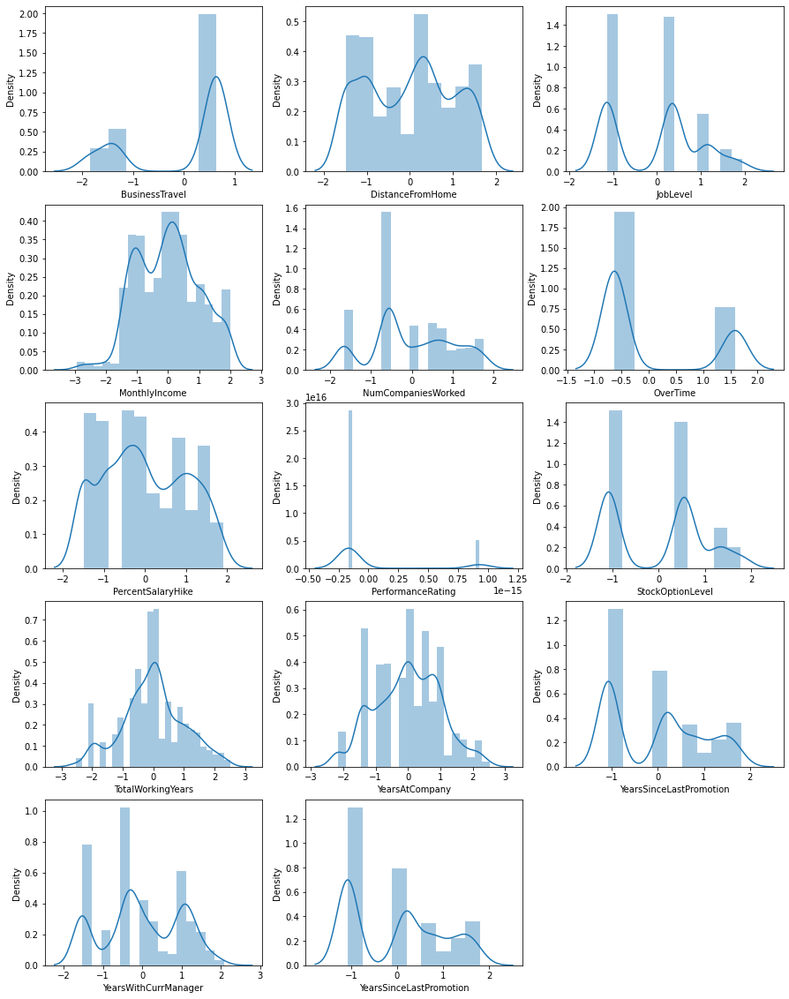

In [120]:
collist=[  'BusinessTravel', 'DistanceFromHome', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'YearsSinceLastPromotion']

plt.figure(figsize=(15,20))
plotnumber = 1

for column in df_Analytics[collist]:
    if plotnumber<=14:
        ax = plt.subplot(5,3,plotnumber)
        sns.distplot(df_Analytics[column])
        plt.xlabel(column,fontsize=10)
    plotnumber+=1
plt.show()

In [121]:
#  data is not normal but the skewness has got removed compared to the old data.

In [122]:
#  Data preprocessing
#  Spliting data into Target and Features:
x=df_Analytics.drop("Attrition",axis=1)
y=df_Analytics["Attrition"]

In [123]:
y.head()

0    1
1    0
2    1
3    0
4    0
Name: Attrition, dtype: int32

In [124]:
x.head()

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,0.638730,1102,2,-1.489968,2,1,2,0,94,...,-1.665335e-16,1,-1.084263,-0.173231,0,1,0.231837,4,-1.073534,0.582177
1,49,-1.380776,279,1,0.244561,1,1,3,1,61,...,9.298118e-16,4,0.548653,0.147620,3,3,0.948319,7,0.193168,1.018073
2,37,0.638730,1373,1,-1.028366,2,4,4,1,92,...,-1.665335e-16,2,-1.084263,-0.351153,3,3,-2.156089,0,-1.073534,-1.528426
3,33,-1.380776,1392,1,-0.698191,4,1,4,0,56,...,-1.665335e-16,3,-1.084263,-0.173231,3,3,0.621429,7,1.027520,-1.528426
4,27,0.638730,591,1,-1.028366,1,3,1,1,40,...,-1.665335e-16,4,0.548653,-0.544046,3,3,-0.933983,2,0.722874,-0.347871


In [125]:
y.shape, x.shape

((1387,), (1387, 30))

In [126]:
#  Now The data is balanced

In [127]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.536681,0.638730,0.734325,1.405373,-1.489968,-0.876177,-0.940815,-0.665328,-1.229911,1.388670,...,-0.424765,-1.575817,-1.084263,-0.173231,-2.171420,-2.501172,0.231837,0.040903,-1.073534,0.582177
1,1.442111,-1.380776,-1.307769,-0.496337,0.244561,-1.853858,-0.940815,0.251978,0.813067,-0.239091,...,2.354241,1.199034,0.548653,0.147620,0.151871,0.336558,0.948319,0.965895,0.193168,1.018073
2,0.083966,0.638730,1.406752,-0.496337,-1.028366,-0.876177,1.305159,1.169285,0.813067,1.290017,...,-0.424765,-0.650866,-1.084263,-0.351153,0.151871,0.336558,-2.156089,-1.192419,-1.073534,-1.528426
3,-0.368749,-1.380776,1.453896,-0.496337,-0.698191,1.079185,-0.940815,1.169285,-1.229911,-0.485721,...,-0.424765,0.274084,-1.084263,-0.173231,0.151871,0.336558,0.621429,0.965895,1.027520,-1.528426
4,-1.047821,0.638730,-0.533609,-0.496337,-1.028366,-1.853858,0.556501,-1.582635,0.813067,-1.274939,...,-0.424765,1.199034,0.548653,-0.544046,0.151871,0.336558,-0.933983,-0.575758,0.722874,-0.347871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,-0.029213,-1.380776,0.193406,-0.496337,1.408969,-0.876177,0.556501,0.251978,0.813067,-1.225613,...,-0.424765,0.274084,0.548653,1.039364,0.151871,0.336558,0.003289,-0.575758,-1.073534,0.018680
1383,0.310324,0.638730,-0.479021,-0.496337,-0.049519,-1.853858,0.556501,1.169285,0.813067,-1.176286,...,-0.424765,-1.575817,0.548653,-0.007630,1.700732,0.336558,0.436162,0.965895,0.193168,1.018073
1384,-1.047821,0.638730,-1.615447,-0.496337,-0.440553,0.101504,-0.940815,-0.665328,0.813067,1.043387,...,2.354241,-0.650866,0.548653,-0.544046,-2.171420,0.336558,0.231837,-0.575758,-1.073534,0.018680
1385,1.442111,-1.380776,0.538304,1.405373,-1.028366,0.101504,0.556501,1.169285,0.813067,-0.140439,...,-0.424765,1.199034,-1.084263,1.039364,0.151871,-1.082307,0.791264,0.657565,-1.073534,1.205782


In [128]:
var_threshold = VarianceThreshold(threshold=0)
var_threshold.fit(x)

VarianceThreshold(threshold=0)

In [129]:
var_threshold.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

In [130]:
x.columns[var_threshold.get_support()]

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobRole',
       'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [131]:
x.shape

(1387, 30)

In [132]:
# taking  out  all the  constant  columns 
cons_columns = [column for column in x.columns
               if column not in x.columns[var_threshold.get_support()]]
print(len(cons_columns))

0


In [133]:
x.drop('PercentSalaryHike', axis =1, inplace=True)

In [134]:
x.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobRole',
       'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'OverTime', 'PerformanceRating',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [135]:
x.shape

(1387, 29)

In [136]:
best_fit = SelectKBest(score_func = f_classif, k =29)
fit = best_fit.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)

In [137]:
fit = best_fit.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
dfcolumns.head()
featureScores = pd.concat([dfcolumns,dfscores],axis = 1)
featureScores.columns = ['Feature', 'Score']
print(featureScores.nlargest(29,'Score'))

                     Feature      Score
18                  OverTime  98.140453
22         TotalWorkingYears  71.035776
15             MonthlyIncome  62.177751
25            YearsAtCompany  58.889790
11                  JobLevel  55.604844
28      YearsWithCurrManager  50.087532
21          StockOptionLevel  43.797179
26        YearsInCurrentRole  41.726267
14             MaritalStatus  36.836958
0                        Age  36.092149
10            JobInvolvement  25.307350
13           JobSatisfaction  18.303387
7    EnvironmentSatisfaction  17.719366
4           DistanceFromHome   9.142284
12                   JobRole   5.747073
3                 Department   5.631654
24           WorkLifeBalance   5.429960
23     TrainingTimesLastYear   4.559904
2                  DailyRate   4.549637
20  RelationshipSatisfaction   3.805168
27   YearsSinceLastPromotion   3.609787
17        NumCompaniesWorked   3.133075
1             BusinessTravel   1.850432
8                     Gender   1.822547


In [138]:
#Selecting the best features based on above scores, we can see that 
#the column "HourlyRate" has most lowest features for the prediction, so we will drop this column

In [139]:
x = x.drop([ "HourlyRate"],axis=1)

In [140]:
x.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'OverTime', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [141]:
#   we have completed features selection process through using 2 techniques.

In [142]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.869496,Age
1,1.013186,BusinessTravel
2,1.024349,DailyRate
3,2.150914,Department
4,1.015470,DistanceFromHome
5,1.060981,Education
6,1.021812,EducationField
7,1.023995,EnvironmentSatisfaction
8,1.024790,Gender
9,1.018162,JobInvolvement


In [143]:
x.drop('PerformanceRating', axis =1, inplace=True)

In [144]:
x.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'OverTime', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [145]:
#  Checking again Multicolinearity using VIF
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.869448,Age
1,1.012757,BusinessTravel
2,1.024348,DailyRate
3,2.148988,Department
4,1.015209,DistanceFromHome
5,1.060236,Education
6,1.021806,EducationField
7,1.023191,EnvironmentSatisfaction
8,1.024644,Gender
9,1.017363,JobInvolvement


In [146]:
#   Every column is less than 10. So, we will create model now.

In [147]:
#  Finding the best random state among all the models
maxAccu=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    LR = LogisticRegression()
    LR.fit(x_train, y_train)
    pred = LR.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9016786570743405  on Random_state  6


In [148]:
#   At random state 6, we are getting best accuracy score i.e., 90%

#    Creating train-test-split

In [149]:
# creating new train test split using the random state.
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

In [150]:
x.shape, y.shape

((1387, 27), (1387,))

In [151]:
x_train.shape,y_train.shape, x_test.shape,y_test.shape

((970, 27), (970,), (417, 27), (417,))

We can see the x.shape value is divided into x_train.shape and x_test.shape and like this y.shape is also divided. As it is a categorical data , so we have to understand this by Classification problem

In [152]:
#Logistic Regression
lr=LogisticRegression()
lr.fit(x_train,y_train)
pred_lr=lr.predict(x_test)

print("accuracy_score: ", accuracy_score(y_test, pred_lr))
print("confusion_matrix: \n", confusion_matrix(y_test, pred_lr))
print("classification_report: \n", classification_report(y_test,pred_lr))

accuracy_score:  0.9016786570743405
confusion_matrix: 
 [[345   8]
 [ 33  31]]
classification_report: 
               precision    recall  f1-score   support

           0       0.91      0.98      0.94       353
           1       0.79      0.48      0.60        64

    accuracy                           0.90       417
   macro avg       0.85      0.73      0.77       417
weighted avg       0.89      0.90      0.89       417



Text(0.5, 1.0, 'Logistic regressor prediction Confusion_matrix')

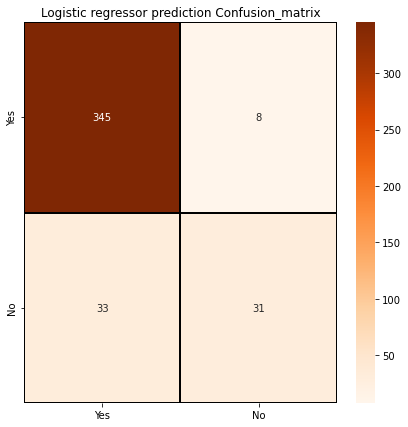

In [164]:
#  Confusion Matrix for Logistic Regression
cm = confusion_matrix(y_test,pred_lr)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Oranges", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("Logistic regressor prediction Confusion_matrix")

In [165]:
#  Classification Algorithms
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.ensemble import GradientBoostingClassifier

In [166]:
#  Random Forest Classifier
rfc = RandomForestClassifier(n_estimators=200)
rfc.fit(x_train,y_train)
pred_rfc = rfc.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_rfc))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_rfc))
print("classification_report: \n",classification_report(y_test,pred_rfc))

accuracy_score:  0.8752997601918465
confusion_matrix: 
 [[350   3]
 [ 49  15]]
classification_report: 
               precision    recall  f1-score   support

           0       0.88      0.99      0.93       353
           1       0.83      0.23      0.37        64

    accuracy                           0.88       417
   macro avg       0.86      0.61      0.65       417
weighted avg       0.87      0.88      0.84       417



Text(0.5, 1.0, 'RFC prediction Confusion_matrix')

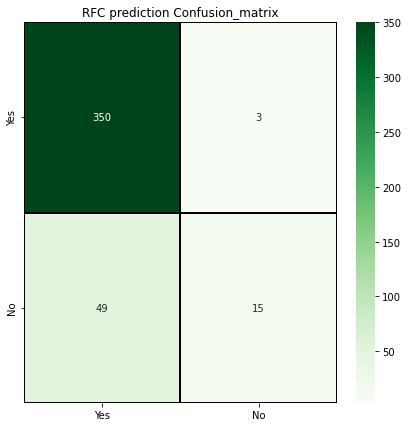

In [168]:
#Confusion Matrix for RFC
cm = confusion_matrix(y_test,pred_rfc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Greens", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("RFC prediction Confusion_matrix")

In [169]:
#Decision Tree Classifier
dtc = DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred_dtc = dtc.predict(x_test)
print("accuracy_score: ",accuracy_score(y_test, pred_dtc))
print(confusion_matrix(y_test, pred_dtc))
print(classification_report(y_test,pred_dtc))

accuracy_score:  0.7841726618705036
[[307  46]
 [ 44  20]]
              precision    recall  f1-score   support

           0       0.87      0.87      0.87       353
           1       0.30      0.31      0.31        64

    accuracy                           0.78       417
   macro avg       0.59      0.59      0.59       417
weighted avg       0.79      0.78      0.79       417



Text(0.5, 1.0, 'DTC prediction Confusion_matrix')

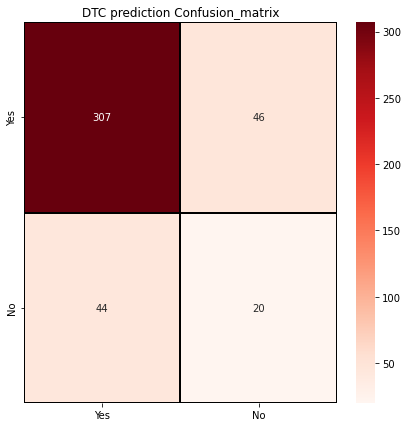

In [170]:
#Confusion Matrix for DTC
cm = confusion_matrix(y_test,pred_dtc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Reds", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("DTC prediction Confusion_matrix")

In [171]:
# Support Vector Machine Classifier
svc = SVC(kernel='linear', gamma=3)
svc.fit(x_train,y_train)
pred_svc = svc.predict(x_test)
print("accuracy_score: ",accuracy_score(y_test, pred_svc))
print(confusion_matrix(y_test, pred_svc))
print(classification_report(y_test,pred_svc))

accuracy_score:  0.9016786570743405
[[347   6]
 [ 35  29]]
              precision    recall  f1-score   support

           0       0.91      0.98      0.94       353
           1       0.83      0.45      0.59        64

    accuracy                           0.90       417
   macro avg       0.87      0.72      0.77       417
weighted avg       0.90      0.90      0.89       417



Text(0.5, 1.0, 'SVC prediction Confusion_matrix')

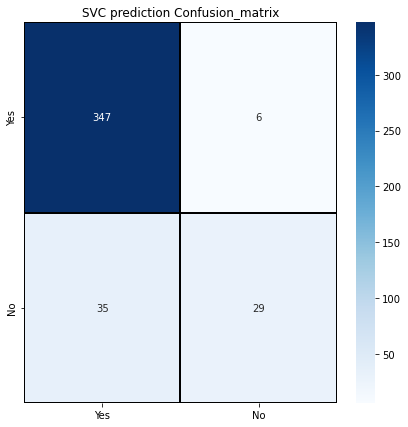

In [175]:
# Confusion Matrix for SVC
cm = confusion_matrix(y_test,pred_svc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]
f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("SVC prediction Confusion_matrix")

In [176]:
#  KNN Classifier
knn = KNN()
knn.fit(x_train,y_train)
pred_knn = knn.predict(x_test)
print("accuracy_score: ",accuracy_score(y_test, pred_knn))
print(confusion_matrix(y_test, pred_knn))
print(classification_report(y_test,pred_knn))

accuracy_score:  0.8561151079136691
[[344   9]
 [ 51  13]]
              precision    recall  f1-score   support

           0       0.87      0.97      0.92       353
           1       0.59      0.20      0.30        64

    accuracy                           0.86       417
   macro avg       0.73      0.59      0.61       417
weighted avg       0.83      0.86      0.83       417



Text(0.5, 1.0, 'KNN prediction Confusion_matrix')

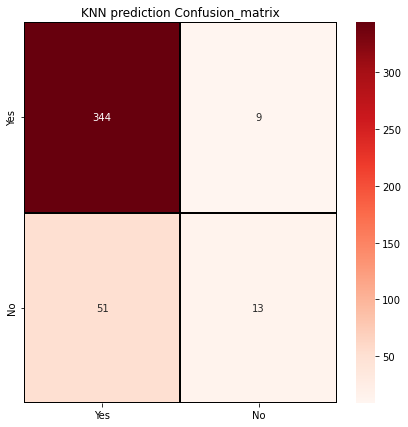

In [177]:
#Confusion Matrix for KNN classifier
cm = confusion_matrix(y_test,pred_knn)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]
f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Reds", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("KNN prediction Confusion_matrix")

In [178]:
# Gradient Boosting Classifier
gb = GradientBoostingClassifier(n_estimators =300,learning_rate=0.1, max_depth=4)
gb.fit(x_train,y_train)
pred_gb = gb.predict(x_test)
print("accuracy_score: ",accuracy_score(y_test, pred_gb))
print(confusion_matrix(y_test, pred_gb))
print(classification_report(y_test,pred_gb))

accuracy_score:  0.8633093525179856
[[341  12]
 [ 45  19]]
              precision    recall  f1-score   support

           0       0.88      0.97      0.92       353
           1       0.61      0.30      0.40        64

    accuracy                           0.86       417
   macro avg       0.75      0.63      0.66       417
weighted avg       0.84      0.86      0.84       417



Text(0.5, 1.0, 'Gradient Boosting classifier prediction Confusion_matrix')

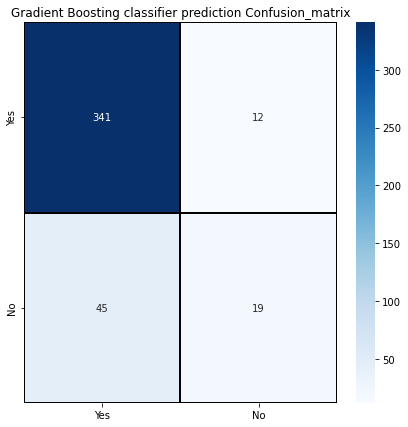

In [179]:
#   Confusion Matrix for Gradient Boosting classifier
cm = confusion_matrix(y_test,pred_gb)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]
f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("Gradient Boosting classifier prediction Confusion_matrix")

In [180]:
#  Cross Validation Score for all the model
#   CV Score for Logistic Regression
print('CV score for Logistic Regression: ',cross_val_score(lr,x,y,cv=9).mean())

CV score for Logistic Regression:  0.8752548526742076


In [181]:
#  CV Score for Random Forest Classifier
print('CV score for Random forest Classifier: ',cross_val_score(rfc,x,y,cv=9).mean())

CV score for Random forest Classifier:  0.8579714192617418


In [182]:
#  CV Score for Decision Tree Classifier
print('CV score for Decision Tree Classifier: ',cross_val_score(dtc,x,y,cv=9).mean())

CV score for Decision Tree Classifier:  0.7664106502816179


In [183]:
#  CV Score for Support Vector Classifier
print('CV score for Support Vector  Classifier: ',cross_val_score(svc,x,y,cv=9).mean())

CV score for Support Vector  Classifier:  0.8774379742121678


In [184]:
#  CV Score for KNN Classifier
print('CV score for KNN Classifier: ',cross_val_score(knn,x,y,cv=9).mean())

CV score for KNN Classifier:  0.8457152166829586


In [185]:
#  CV Score for Gradient Boosting Classifier
print('CV score for Gradient Boosting Classifier: ',cross_val_score(gb,x,y,cv=9).mean())

CV score for Gradient Boosting Classifier:  0.8630172694688824


In [186]:
#  From the observation of accuracy and cross validation score and their difference 
#  we can predict that Support Vector Machine Classifier is the best model

In [187]:
#  Support Vector Machine Classifier
svc=SVC(random_state=42)

In [188]:
param_grid = {'C':[1,10,100,1000],'gamma':[1,0.1,0.001,0.0001], 'kernel':['linear','rbf']}

In [189]:
CV_SVC = GridSearchCV(SVC(),param_grid,refit = True, verbose=2)

In [190]:
CV_SVC.fit(x_train,y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ...........................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ...........................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ...........................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ...........................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ...........................C=1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ......................C=1, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END ......................C=1, gamma=0.1, 

[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   2.0s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   2.0s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   2.0s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   2.0s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .................C=100, gamma=0.0001, kernel=linear; total time=   1.9s
[CV] END .................C=100, gamma=0.0001, kernel=linear; total time=   1.9s
[CV] END .................C=100, gamma=0.0001, kernel=linear; total time=   1.9s
[CV] END .................C=

GridSearchCV(estimator=SVC(),
             param_grid={'C': [1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.001, 0.0001],
                         'kernel': ['linear', 'rbf']},
             verbose=2)

In [191]:
CV_SVC.best_params_

{'C': 100, 'gamma': 1, 'kernel': 'linear'}

In [192]:
predic = CV_SVC.predict(x_test)

In [193]:
print(classification_report(y_test,predic))
print(confusion_matrix(y_test, predic))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94       353
           1       0.83      0.45      0.59        64

    accuracy                           0.90       417
   macro avg       0.87      0.72      0.77       417
weighted avg       0.90      0.90      0.89       417

[[347   6]
 [ 35  29]]


In [194]:
acc=accuracy_score(y_test,predic)
print(acc*100)

90.16786570743405


In [196]:
#  the final model gives 90% accuracy after tuning.

In [197]:
#  ROC-AUC Curve
fpr, tpr, threshold = roc_curve(y_test,pred)
auc = roc_auc_score(y_test,pred)

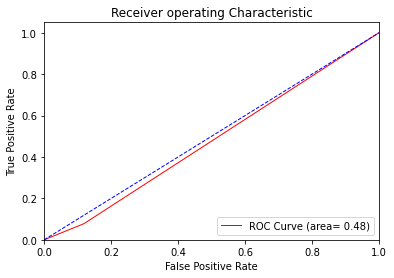

In [201]:
plt.figure()
plt.plot(fpr,tpr,color="red",lw=1,label="ROC Curve (area= %0.2f)" % auc)
plt.plot([0,1],[0,1],color="blue",lw=1,linestyle="--")
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating Characteristic")
plt.legend(loc="lower right")
plt.show()

In [202]:
#This is the AUC-ROC curve for the models which is plotted False 
#positive rate against True positive rate. So the best model has the area under curve as 0.48.

In [203]:
#  Saving the Model
import pickle
filename='HR_Analytics_Project.pickle'
pickle.dump(CV_SVC,open(filename,'wb'))
loaded_model = pickle.load(open(filename, 'rb'))
loaded_model.predict(x_test)

array([0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,

In [204]:
#  Checking predicted and original values
a =np.array(y_test)
predicted=np.array(CV_SVC.predict(x_test))
HR_Project=pd.DataFrame({'Orginal':a,'Predicted':predicted}, index=range(len(a)))
HR_Project

,Orginal,Predicted
0,0,0
1,0,0
2,0,0
3,1,1
4,1,1
...,...,...
412,0,0
413,0,0
414,0,1
415,0,0


In [205]:
model =HR_Project.to_csv('HR_Analytics_Project.csv')
model